# Vaccination Outcomes of World...
In this notebook, I have done Data Analysis and Visualization of the COVID-19 World Vaccination Progress dataset on Kaggle. 

Please feel free to reach out to me Linkedin if you have any questions! 
https://www.linkedin.com/in/vidurgupta1999/

## The data is dated till 29 January (Last updated)

# Necessary Imports

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected = False)
import cufflinks as cf
cf.go_offline(True)

Reading the files csv data files.

In [2]:
data=pd.read_csv('../input/covid-world-vaccination-progress/country_vaccinations.csv')
data2=pd.read_csv('../input/covid-19/data/countries-aggregated.csv')

In [3]:
data.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,https://reliefweb.int/report/afghanistan/afgha...


In [4]:
data.tail()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
14989,Zimbabwe,ZWE,2021-04-28,458013.0,388021.0,69992.0,24074.0,17860.0,3.08,2.61,0.47,1202.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1388935941...
14990,Zimbabwe,ZWE,2021-04-29,477597.0,400771.0,76826.0,19584.0,17971.0,3.21,2.70,0.52,1209.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1388935941...
14991,Zimbabwe,ZWE,2021-04-30,500342.0,414735.0,85607.0,22745.0,19194.0,3.37,2.79,0.58,1291.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1388935941...
14992,Zimbabwe,ZWE,2021-05-01,520299.0,428135.0,92164.0,19957.0,21171.0,3.50,2.88,0.62,1424.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1388935941...
14993,Zimbabwe,ZWE,2021-05-02,524199.0,430068.0,94131.0,3900.0,19169.0,3.53,2.89,0.63,1290.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1388935941...


In [5]:
data.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million
count,9.011000e+03,8.370000e+03,6.158000e+03,7.575000e+03,1.479600e+04,9011.000000,8370.000000,6158.00000,14796.000000
mean,4.964584e+06,3.164030e+06,1.580482e+06,1.347569e+05,7.769163e+04,15.456079,11.228710,5.66235,2972.163625
std,2.033452e+07,1.180919e+07,6.840161e+06,5.211912e+05,3.519679e+05,23.238675,15.269686,10.06184,4720.846894
min,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.00000,0.000000
25%,6.000000e+04,5.154925e+04,2.350025e+04,2.888500e+03,8.967500e+02,1.330000,1.222500,0.63000,347.000000
50%,4.209400e+05,3.255035e+05,1.729175e+05,1.558300e+04,6.178500e+03,6.300000,4.825000,2.35000,1475.000000
75%,1.932222e+06,1.338161e+06,6.887102e+05,6.249850e+04,2.835000e+04,19.570000,14.667500,6.30000,3908.250000
max,2.753380e+08,1.470470e+08,1.047747e+08,1.160100e+07,7.205286e+06,211.080000,111.320000,99.76000,118759.000000


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14994 entries, 0 to 14993
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              14994 non-null  object 
 1   iso_code                             14994 non-null  object 
 2   date                                 14994 non-null  object 
 3   total_vaccinations                   9011 non-null   float64
 4   people_vaccinated                    8370 non-null   float64
 5   people_fully_vaccinated              6158 non-null   float64
 6   daily_vaccinations_raw               7575 non-null   float64
 7   daily_vaccinations                   14796 non-null  float64
 8   total_vaccinations_per_hundred       9011 non-null   float64
 9   people_vaccinated_per_hundred        8370 non-null   float64
 10  people_fully_vaccinated_per_hundred  6158 non-null   float64
 11  daily_vaccinations_per_milli

In [7]:
data.isnull().sum()

country                                   0
iso_code                                  0
date                                      0
total_vaccinations                     5983
people_vaccinated                      6624
people_fully_vaccinated                8836
daily_vaccinations_raw                 7419
daily_vaccinations                      198
total_vaccinations_per_hundred         5983
people_vaccinated_per_hundred          6624
people_fully_vaccinated_per_hundred    8836
daily_vaccinations_per_million          198
vaccines                                  0
source_name                               0
source_website                            0
dtype: int64

In [8]:
data.corr()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million
total_vaccinations,1.000000,0.989466,0.948051,0.877928,0.933807,0.147796,0.185549,0.141239,0.076931
people_vaccinated,0.989466,1.000000,0.891717,0.883924,0.942849,0.175373,0.182271,0.113318,0.091055
people_fully_vaccinated,0.948051,0.891717,1.000000,0.752659,0.806335,0.175006,0.161927,0.188135,0.114811
daily_vaccinations_raw,0.877928,0.883924,0.752659,1.000000,0.947487,0.062099,0.102875,0.062385,0.051084
daily_vaccinations,0.933807,0.942849,0.806335,0.947487,1.000000,0.065948,0.105430,0.056087,0.053298
total_vaccinations_per_hundred,0.147796,0.175373,0.175006,0.062099,0.065948,1.000000,0.972708,0.938034,0.579906
people_vaccinated_per_hundred,0.185549,0.182271,0.161927,0.102875,0.105430,0.972708,1.000000,0.840570,0.618224
people_fully_vaccinated_per_hundred,0.141239,0.113318,0.188135,0.062385,0.056087,0.938034,0.840570,1.000000,0.594106
daily_vaccinations_per_million,0.076931,0.091055,0.114811,0.051084,0.053298,0.579906,0.618224,0.594106,1.000000


<AxesSubplot:>

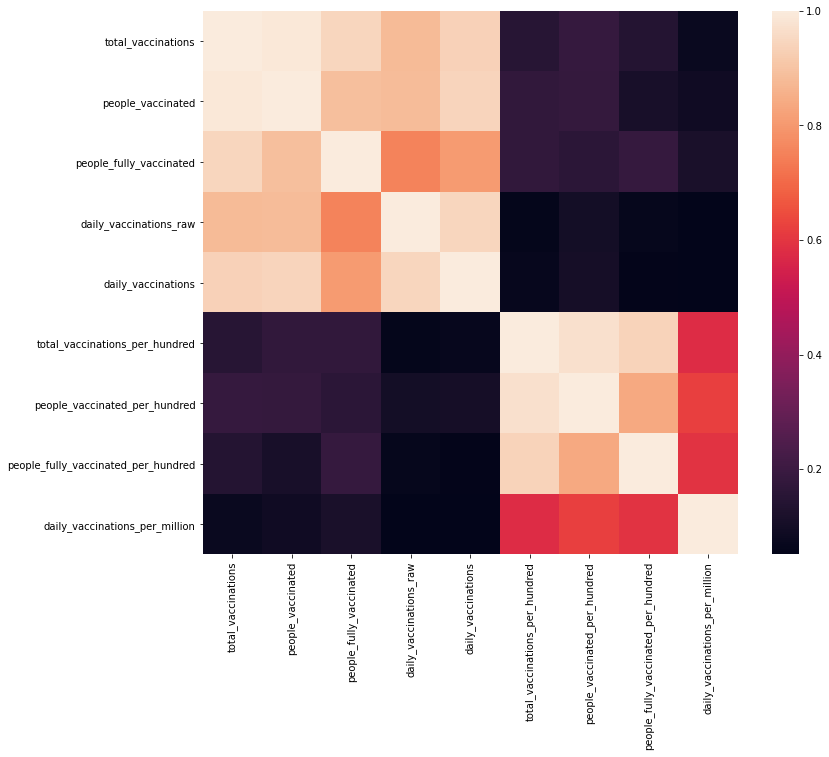

In [9]:
plt.figure(figsize=(12,10))
sns.heatmap(data.corr())

<AxesSubplot:>

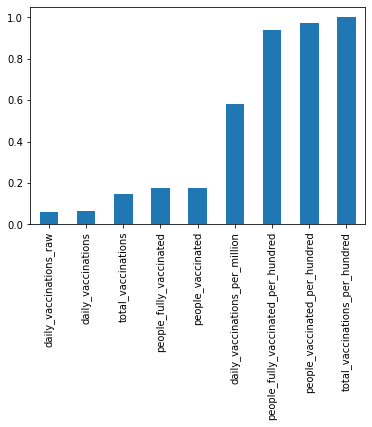

In [10]:
data.corr()['total_vaccinations_per_hundred'].sort_values().plot(kind='bar')

<AxesSubplot:>

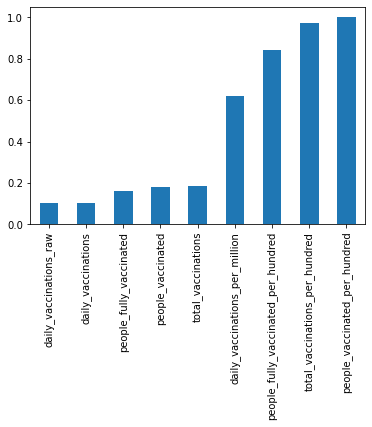

In [11]:
data.corr()['people_vaccinated_per_hundred'].sort_values().plot(kind='bar')

<AxesSubplot:>

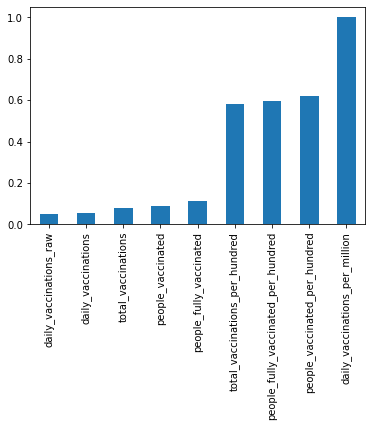

In [12]:
data.corr()['daily_vaccinations_per_million'].sort_values().plot(kind='bar')

**Moreover we will be using plotly's choropleth map-graph which gives a clear and interactive understanding on the feautres by there corresponding place on map.
To read more about :-  [Plotly's Choropleth Graphs](https://plotly.com/python/choropleth-maps/)**

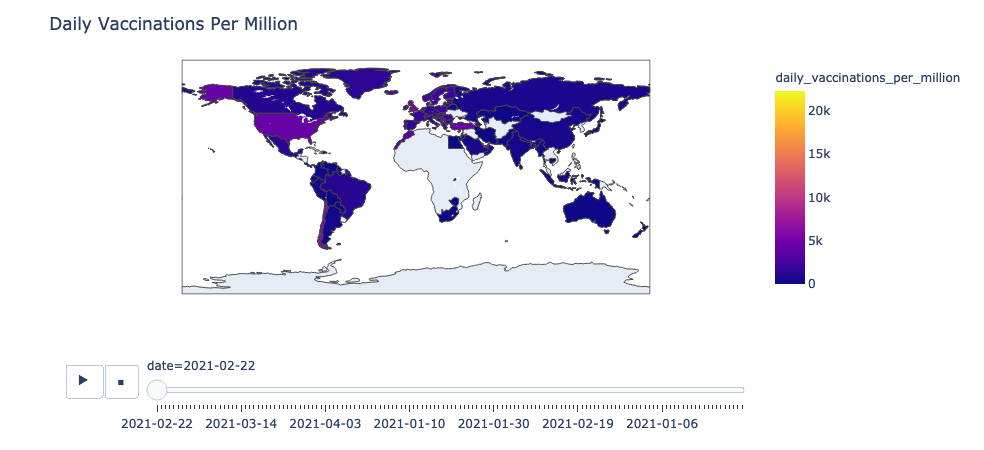

In [13]:
fig=px.choropleth(data_frame=data,
                          locations=data['country'],
                          locationmode='country names',
                          color=data['daily_vaccinations_per_million'],
                          animation_frame=data['date'],
                          animation_group=data['vaccines'])
fig.update_layout(dict1={'title':'Daily Vaccinations Per Million'})

fig.show() 

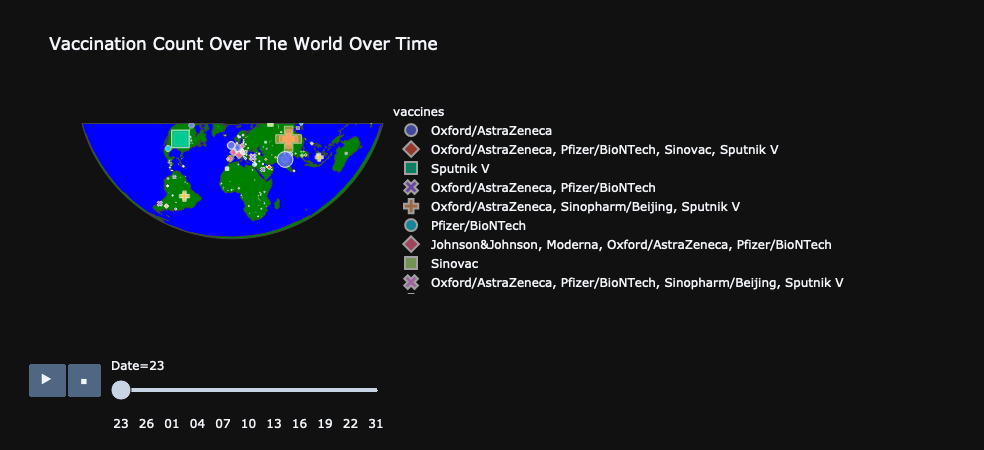

In [14]:
data.dropna(subset=['daily_vaccinations'],inplace=True)
s=data['date'].str.split('-',expand=True)
data['Year']=s[0]
data['Month']=s[1]
data['Date']=s[2]
fig1=px.scatter_geo(data,color='vaccines',locationmode="ISO-3",locations="iso_code",opacity=0.6,
                     hover_name="iso_code", size="daily_vaccinations",projection='conic equal area',animation_group ="iso_code",color_continuous_scale='blackbody',
                     animation_frame="Date",scope='world',symbol='vaccines',template="plotly_dark",title='Vaccination Count Over The World Over Time' )
fig1.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 400

fig1.update_geos(
    landcolor="green",
    oceancolor="blue",
    showocean=True,
    lakecolor="LightBlue"
)

fig1.update_traces(
    marker_coloraxis=None
)
fig1.show()

**We can clearly see that Pfizer/Biotech's impact in USA and Covaxin's impact on India is huge and it keeps on growing by the date increases . We can also see heavy impact of CNBG/Cinovac starting in China . Sinovac takes a sudden roll in Turkey on 14th and keeps on growing after that :)**

# Which vaccine is distributed in the world the most ??¶

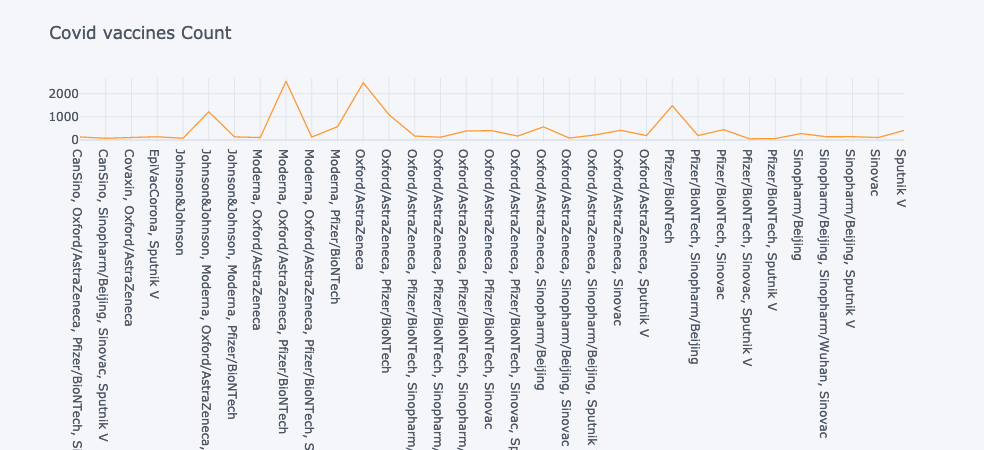

In [15]:
data.groupby('vaccines')['country'].count().iplot(title='Covid vaccines Count')

We see the Pfizer/BioNTech, AstraZeneca and Moderna is mostly used for vaccination.

In [16]:
fig=px.choropleth(data_frame=data,
                          locations=data['country'],
                          locationmode='country names',
                          color=data['total_vaccinations_per_hundred'],
                          animation_frame=data['date'],
                          animation_group=data['vaccines'])
fig.update_layout(dict1={'title':'Total Vaccinations per hundred'})
fig.show() 

By seeing the below graph, we can estimate the impact of Pfizer, BioNTech and Moderna vaccine on the world.

In [17]:
s=data.drop_duplicates(subset=['iso_code'])['vaccines'].apply(lambda x: x.split(','))
dic={}
for i in s:
    for j in i :
        if j[0]==' ':
            k= j[1:]
        elif j[-1]==' ':
            k=j[:-1]
        else:
            k=j
        if k not in dic :
            dic[k]=1
        else:
            dic[k]+=1
px.bar(x=list(dic.keys()),y=list(dic.values()),color=list(dic.keys()),template='plotly_dark',labels={'x':'Vaccine Name','y':'Total Count'})

In [18]:
df = px.data.gapminder()
fig = px.scatter_geo(df, locations="iso_alpha", color="continent",
                     hover_name="country", size="pop",
                     animation_frame="year",
                     projection="natural earth")
fig.show()

Displays which vaccine is most popular 

In [19]:
data.groupby('country')['total_vaccinations_per_hundred'].mean().sort_values()[40:].iplot(title='Top 20 countries based on Total Vaccinations Per Hundred')
data.groupby('country')['daily_vaccinations_per_million'].mean().sort_values()[40:].iplot(title='Top 20 countries based on Daily Vaccinations Per Million ')

Exploring the change in death rate after the vaccine was introduced:
    Amount of confirmed cases, recoveries, and deaths.

In [20]:
arr=[]
index1=data.groupby(['country','date']).count().index
index2=data2.groupby(['Country','Date']).count().index
for i in index2:
    if i in index1:
        arr.append(1)
    else:
        arr.append(0)
data2['Vaccine_is_there']=arr
data2.head()

,Date,Country,Confirmed,Recovered,Deaths,Vaccine_is_there
0,2020-01-22,Afghanistan,0,0,0,0
1,2020-01-23,Afghanistan,0,0,0,0
2,2020-01-24,Afghanistan,0,0,0,0
3,2020-01-25,Afghanistan,0,0,0,0
4,2020-01-26,Afghanistan,0,0,0,0


In [21]:
t=data2.groupby(['Country']).sum()
cons=t[t['Vaccine_is_there']==0].index
dan=data2[~data2['Country'].isin(cons)]

Explore Corresponding Outcomes of COVID-19 Vaccines

In [22]:
data2['Date']=pd.to_datetime(data2['Date'])
dfs=list(data2.groupby("Country"))
first_title = dfs[0][0]
traces = []
buttons = []
for i,d in enumerate(dfs):
    visible=[False]*len(dfs)
    visible[i]=True
    name=d[0]
    p=d[1][d[1]['Vaccine_is_there']==0]
    n=d[1][d[1]['Vaccine_is_there']==1]
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=p['Date'],y=p['Deaths'].values))
    fig.add_trace(go.Scatter(x=n['Date'],y=n['Deaths'].values))
    
    traces.append(
    fig.update_traces(visible=True if i==0 else False).data[0])
    buttons.append(dict(label=name,
                        method="update",
                        args=[{"visible":visible},
                              {"title":f"{name}"}]))

updatemenus = [{'active':0, "buttons":buttons}]
shapes=[({'type': 'line',
               'xref': 'x',
               'yref': 'y',
               'x0': '2020-12-29' ,
               'y0': 0,
               'x1': '2020-12-29',
               'y1': 3000})]
fig = go.Figure(data=traces,
                 layout=dict(updatemenus=updatemenus,shapes=shapes,template='plotly_dark'))
fig.update_layout(title=first_title, title_x=0.5)
fig.show()